# MMFusion results analysis
Small notebook to compute the splicing analysis results for MMFusion.
This detector corresponds to the entry [78] of the paper's bibliography.

## Libraries import

In [1]:
import os
import glob
import sys
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import PIL.Image as Image
import cv2
from tqdm.notebook import tqdm
mpl.use("pgf")
pgf_with_rc_fonts = {
    "font.family": "serif",
    "font.serif": [],                   # use latex default serif font
    "font.sans-serif": ["DejaVu Sans"], # use a specific sans-serif font
}
mpl.rcParams.update(pgf_with_rc_fonts)
import matplotlib.pyplot as plt
fontsize = 18
plt.rc('text', usetex=True)
plt.rc('font', family='sans',size=fontsize)
plt.rc('legend',fontsize=fontsize)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)
plt.rc('axes',labelsize=fontsize,titlesize=fontsize)
plt.rc('lines',linewidth=2)
%matplotlib inline
import warnings

warnings.filterwarnings('ignore')

## Execution params

In [12]:
detector = 'MMFusion'
results_dir = f'/nas/public/exchange/JPEG-AI/code/results/{detector}'
results_root = '/nas/public/exchange/JPEG-AI/code'

## Load results

In [14]:
results_df = pd.read_csv(os.path.join(results_dir, 'splicing_localization_metrics.csv'), index_col=[0, 1, 2, 3])
results_df.index.rename(['Type', 'Dataset', 'Quality', 'Path'], inplace=True)
#results_df.rename(index={'NaN':'NA'}, level='Quality', inplace=True)
results_df.index = pd.MultiIndex.from_frame(
        results_df.index.to_frame().fillna('Uncompressed')
    )
results_df

AUC  \
Type          Dataset Quality      Path                                                           
Uncompressed  CASIA1  Uncompressed /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.728295   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.956842   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.997867   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.999851   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.737002   
...                                                                                         ...   
Double JPEGAI DSO-1   2.0          /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.434077   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.730430   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.904892   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.977443   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.983347   

                                                                                         BA@0.5  \
Type          Dataset Quality      Path                                                           
Uncompressed  CASIA1  Uncompressed /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.491449   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.680657   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.808758   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.974633   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.498758   
...                                                                                         ...   
Double JPEGAI DSO-1   2.0          /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.499575   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.693520   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.770962   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.899623   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.894430   

                                                                                        BA best  \
Type          Dataset Quality      Path                                                           
Uncompressed  CASIA1  Uncompressed /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.747460   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.897251   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.979635   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.997805   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.711526   
...                                                                                         ...   
Double JPEGAI DSO-1   2.0          /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.546779   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.712594   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.876092   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.928986   
                                   /nas/public/exchange/JPEG-AI/data/TEST_SPLICED/...  0.937587   

                                                                                         F1@0.5  \
Type          Dataset Quality      Path                                                           
Uncompressed  CASIA1  Uncompre

## Let's re-organize and see the mean metrics

In [15]:
# Let's select the simple uncompressed VS JPEGAI case
mean_df = results_df.groupby(['Type', 'Quality']).mean()
mean_df = mean_df.loc[['Uncompressed', 'JPEGAI']].droplevel(0).transpose()
mean_df.columns.name = ''
mean_df.index = mean_df.index.map(lambda x: str(x))
mean_df = pd.concat({detector: mean_df}, names=['Detector', 'Metric'])
mean_df


Uncompressed      0.12      0.25       0.5      0.75  \
Detector Metric                                                          
MMFusion AUC          0.913636  0.722222  0.768931  0.838137  0.850583   
         BA@0.5       0.796974  0.566466  0.596813  0.675838  0.695045   
         BA best      0.906591  0.740607  0.777634  0.834556  0.846029   
         F1@0.5       0.700943  0.305621  0.357048  0.494119  0.522968   
         F1 best      0.811113  0.446623  0.509909  0.640215  0.658716   
         FPR@0.5      0.043983  0.056628  0.051919  0.039716  0.039033   

                       1.0       2.0  
Detector Metric                       
MMFusion AUC      0.873444  0.883442  
         BA@0.5   0.727486  0.736001  
         BA best  0.866003  0.873566  
         F1@0.5   0.577970  0.584978  
         F1 best  0.704492  0.715307  
         FPR@0.5  0.036615  0.037704

### Let's print it

In [16]:
print(mean_df.to_latex(float_format='%.2f'))

\begin{tabular}{llrrrrrrr}
\toprule
 &  & Uncompressed & 0.120000 & 0.250000 & 0.500000 & 0.750000 & 1.000000 & 2.000000 \\
Detector & Metric &  &  &  &  &  &  &  \\
\midrule
\multirow[t]{6}{*}{MMFusion} & AUC & 0.91 & 0.72 & 0.77 & 0.84 & 0.85 & 0.87 & 0.88 \\
 & BA@0.5 & 0.80 & 0.57 & 0.60 & 0.68 & 0.70 & 0.73 & 0.74 \\
 & BA best & 0.91 & 0.74 & 0.78 & 0.83 & 0.85 & 0.87 & 0.87 \\
 & F1@0.5 & 0.70 & 0.31 & 0.36 & 0.49 & 0.52 & 0.58 & 0.58 \\
 & F1 best & 0.81 & 0.45 & 0.51 & 0.64 & 0.66 & 0.70 & 0.72 \\
 & FPR@0.5 & 0.04 & 0.06 & 0.05 & 0.04 & 0.04 & 0.04 & 0.04 \\
\cline{1-9}
\bottomrule
\end{tabular}



### What about the effect of JPEG?

In [17]:
# Let's select the simple uncompressed VS JPEGAI case
mean_df = results_df.groupby(['Type', 'Quality']).mean()
mean_df = mean_df.loc[['Uncompressed', 'JPEG']].droplevel(0).transpose()
mean_df.columns.name = ''
mean_df.index = mean_df.index.map(lambda x: str(x))
mean_df = pd.concat({detector: mean_df}, names=['Detector', 'Metric'])
mean_df


Uncompressed      65.0      75.0      85.0      95.0
Detector Metric                                                       
MMFusion AUC          0.913636  0.845190  0.851331  0.857366  0.879424
         BA@0.5       0.796974  0.716583  0.718993  0.726102  0.755482
         BA best      0.906591  0.847827  0.851777  0.858188  0.875129
         F1@0.5       0.700943  0.616660  0.617657  0.631266  0.673824
         F1 best      0.811113  0.738646  0.746386  0.764002  0.793539
         FPR@0.5      0.043983  0.100155  0.099129  0.099963  0.091783

### Let's consider the DSO-1 dataset in particular

In [18]:
# Let's select the simple uncompressed VS JPEGAI case
mean_df = results_df.loc[pd.IndexSlice[:, 'DSO-1', :, :]].groupby(['Type', 'Quality']).mean()
mean_df = mean_df.loc[['Uncompressed', 'JPEGAI']].droplevel(0).transpose()
mean_df.columns.name = ''
mean_df.index = mean_df.index.map(lambda x: str(x))
mean_df = pd.concat({detector: mean_df}, names=['Detector', 'Metric'])
mean_df


Uncompressed      0.12      0.25       0.5      0.75  \
Detector Metric                                                          
MMFusion AUC          0.993687  0.747199  0.802218  0.848665  0.858790   
         BA@0.5       0.950954  0.577264  0.642033  0.729009  0.740255   
         BA best      0.981394  0.732187  0.778485  0.830736  0.840654   
         F1@0.5       0.889755  0.289494  0.332636  0.477896  0.504591   
         F1 best      0.939937  0.397898  0.484953  0.609124  0.629655   
         FPR@0.5      0.014948  0.082247  0.141938  0.121694  0.118454   

                       1.0       2.0  
Detector Metric                       
MMFusion AUC      0.901233  0.911162  
         BA@0.5   0.781928  0.793501  
         BA best  0.875393  0.885028  
         F1@0.5   0.598041  0.612151  
         F1 best  0.714290  0.728529  
         FPR@0.5  0.078081  0.079491

In [19]:
# Let's select the simple uncompressed VS JPEG case
mean_df = results_df.loc[pd.IndexSlice[:, 'DSO-1', :, :]].groupby(['Type', 'Quality']).mean()
mean_df = mean_df.loc[['Uncompressed', 'JPEG']].droplevel(0).transpose()
mean_df.columns.name = ''
mean_df.index = mean_df.index.map(lambda x: str(x))
mean_df = pd.concat({detector: mean_df}, names=['Detector', 'Metric'])
mean_df


Uncompressed      65.0      75.0      85.0      95.0
Detector Metric                                                       
MMFusion AUC          0.993687  0.891846  0.900439  0.907161  0.956718
         BA@0.5       0.950954  0.772471  0.773629  0.784078  0.856598
         BA best      0.981394  0.864742  0.870308  0.881908  0.932672
         F1@0.5       0.889755  0.579972  0.582017  0.607945  0.729359
         F1 best      0.939937  0.686323  0.696030  0.725898  0.826741
         FPR@0.5      0.014948  0.079987  0.076684  0.064450  0.042348

In [20]:
# Let's print it
print(mean_df.to_latex(float_format='%.2f'))

\begin{tabular}{llrrrrr}
\toprule
 &  & Uncompressed & 65.000000 & 75.000000 & 85.000000 & 95.000000 \\
Detector & Metric &  &  &  &  &  \\
\midrule
\multirow[t]{6}{*}{MMFusion} & AUC & 0.99 & 0.89 & 0.90 & 0.91 & 0.96 \\
 & BA@0.5 & 0.95 & 0.77 & 0.77 & 0.78 & 0.86 \\
 & BA best & 0.98 & 0.86 & 0.87 & 0.88 & 0.93 \\
 & F1@0.5 & 0.89 & 0.58 & 0.58 & 0.61 & 0.73 \\
 & F1 best & 0.94 & 0.69 & 0.70 & 0.73 & 0.83 \\
 & FPR@0.5 & 0.01 & 0.08 & 0.08 & 0.06 & 0.04 \\
\cline{1-7}
\bottomrule
\end{tabular}



## Let's see some examples of masks from DSO-1 

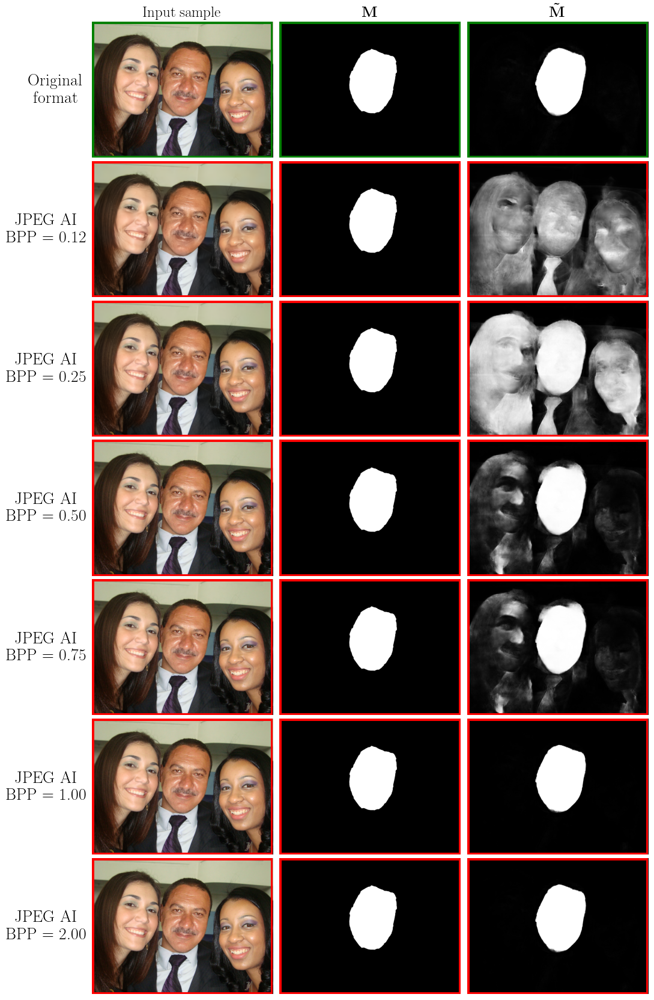

In [10]:
import matplotlib.patches as patches

unc_df = pd.read_csv(os.path.join(results_dir, 'Uncompressed', 'results.csv'), index_col=[0, 1])
jpegai_df = pd.read_csv(os.path.join(results_dir, 'JPEGAI', 'results.csv'), index_col=[0, 1])
filename = 'splicing-99'
samples = jpegai_df.loc[jpegai_df['filename']==filename]
fig, axs = plt.subplots(len(samples['target_bpp'].unique())+1, 3, figsize=(12, 3*(len(samples['target_bpp'].unique())+1)))

# Plot everything
for idx, bpp in enumerate(sorted(samples['target_bpp'].unique())):
    # Load sample
    row = samples.loc[samples['target_bpp']==bpp]
    img = Image.open(row.index.values[0][1])
    gt = Image.open(row['gt'].item()).convert('L')
    gt = np.array(gt) < 0.1  # convert as DSO-1 masks are swapped
    mask = np.load(os.path.join(results_root, row['mask_path'].item()))
    axs[idx+1][0].imshow(img), axs[idx+1][1].imshow(gt, cmap='gray'), axs[idx+1][2].imshow(mask, cmap='gray')
    axs[idx+1][0].axis('off'), axs[idx+1][1].axis('off'), axs[idx+1][2].axis('off')
    
    # Add red contour
    for ax in axs[idx+1]:
        rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    
    # Add text
    axs[idx+1][0].text(-0.25, 0.5, f'JPEG AI\n BPP = {bpp:.2f}', transform=axs[idx+1][0].transAxes, fontsize=20, va='center', ha='center')

# Load original sample and mask
row = unc_df.loc[unc_df['filename']==filename]
img = Image.open(row.index.values[0][1])
mask = np.load(os.path.join(results_root, row['mask_path'].item()))
axs[0][0].imshow(img), axs[0][1].imshow(gt, cmap='gray'), axs[0][2].imshow(mask, cmap='gray')
axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{M}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}$')
axs[0][0].axis('off'), axs[0][1].axis('off'), axs[0][2].axis('off')

# Add green contour to the first row
for ax in axs[0]:
    rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='g', facecolor='none')
    ax.add_patch(rect)

# Add text to the first row
axs[0][0].text(-0.2, 0.5, 'Original\n format', transform=axs[0][0].transAxes, fontsize=20, va='center', ha='center')

# Adjust the space between rows 
#fig.tight_layout()
fig.subplots_adjust(hspace=0.025, wspace=0.025)
plt.show()


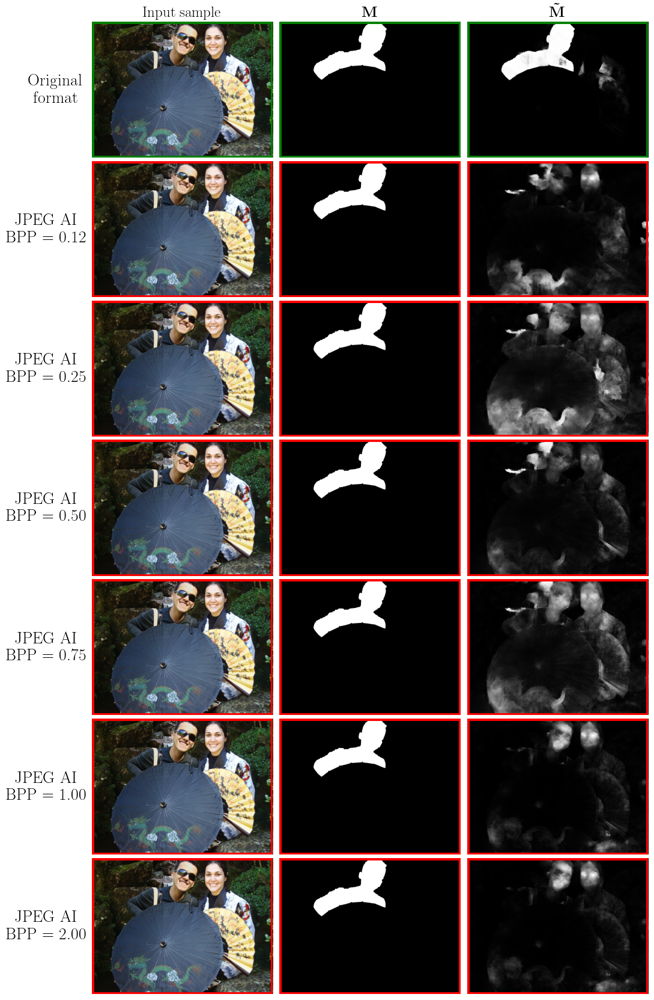

In [11]:
import matplotlib.patches as patches

unc_df = pd.read_csv(os.path.join(results_dir, 'Uncompressed', 'results.csv'), index_col=[0, 1])
jpegai_df = pd.read_csv(os.path.join(results_dir, 'JPEGAI', 'results.csv'), index_col=[0, 1])
filename = 'splicing-34'
samples = jpegai_df.loc[jpegai_df['filename']==filename]
fig, axs = plt.subplots(len(samples['target_bpp'].unique())+1, 3, figsize=(12, 3*(len(samples['target_bpp'].unique())+1)))

# Plot everything
for idx, bpp in enumerate(sorted(samples['target_bpp'].unique())):
    # Load sample
    row = samples.loc[samples['target_bpp']==bpp]
    img = Image.open(row.index.values[0][1])
    gt = Image.open(row['gt'].item()).convert('L')
    gt = np.array(gt) < 0.1  # convert as DSO-1 masks are swapped
    mask = np.load(os.path.join(results_root, row['mask_path'].item()))
    axs[idx+1][0].imshow(img), axs[idx+1][1].imshow(gt, cmap='gray'), axs[idx+1][2].imshow(mask, cmap='gray')
    axs[idx+1][0].axis('off'), axs[idx+1][1].axis('off'), axs[idx+1][2].axis('off')
    
    # Add red contour
    for ax in axs[idx+1]:
        rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    
    # Add text
    axs[idx+1][0].text(-0.25, 0.5, f'JPEG AI\n BPP = {bpp:.2f}', transform=axs[idx+1][0].transAxes, fontsize=20, va='center', ha='center')

# Load original sample and mask
row = unc_df.loc[unc_df['filename']==filename]
img = Image.open(row.index.values[0][1])
mask = np.load(os.path.join(results_root, row['mask_path'].item()))
axs[0][0].imshow(img), axs[0][1].imshow(gt, cmap='gray'), axs[0][2].imshow(mask, cmap='gray')
axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{M}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}$')
axs[0][0].axis('off'), axs[0][1].axis('off'), axs[0][2].axis('off')

# Add green contour to the first row
for ax in axs[0]:
    rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='g', facecolor='none')
    ax.add_patch(rect)

# Add text to the first row
axs[0][0].text(-0.2, 0.5, 'Original\n format', transform=axs[0][0].transAxes, fontsize=20, va='center', ha='center')

# Adjust the space between rows 
#fig.tight_layout()
fig.subplots_adjust(hspace=0.025, wspace=0.025)
plt.show()


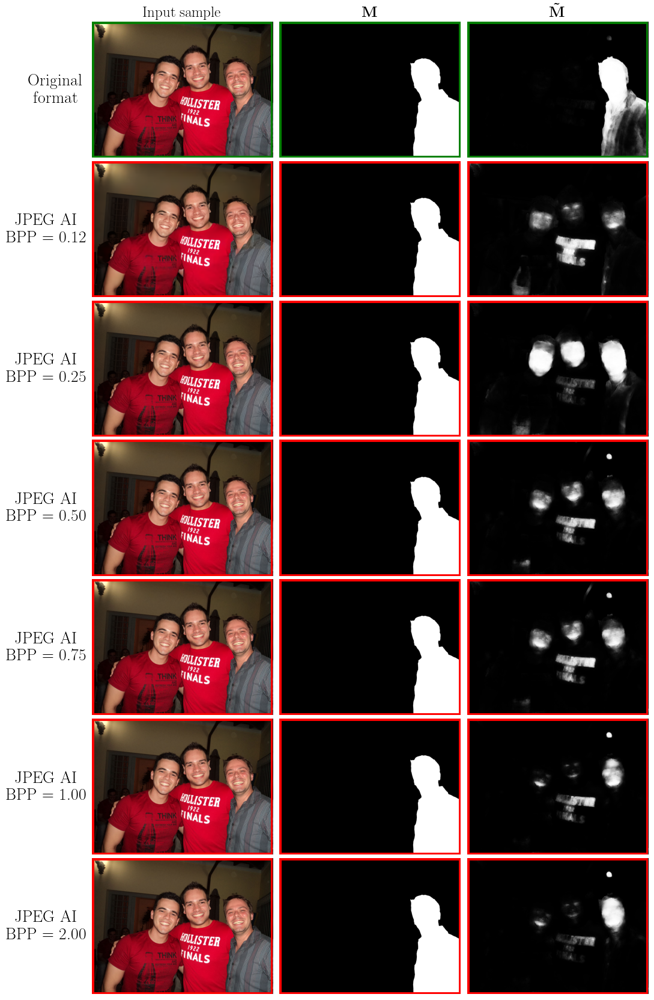

In [21]:
import matplotlib.patches as patches

unc_df = pd.read_csv(os.path.join(results_dir, 'Uncompressed', 'results.csv'), index_col=[0, 1])
jpegai_df = pd.read_csv(os.path.join(results_dir, 'JPEGAI', 'results.csv'), index_col=[0, 1])
filename = 'splicing-12'
samples = jpegai_df.loc[jpegai_df['filename']==filename]
fig, axs = plt.subplots(len(samples['target_bpp'].unique())+1, 3, figsize=(12, 3*(len(samples['target_bpp'].unique())+1)))

# Plot everything
for idx, bpp in enumerate(sorted(samples['target_bpp'].unique())):
    # Load sample
    row = samples.loc[samples['target_bpp']==bpp]
    img = Image.open(row.index.values[0][1])
    gt = Image.open(row['gt'].item()).convert('L')
    gt = np.array(gt) < 0.1  # convert as DSO-1 masks are swapped
    mask = np.load(os.path.join(results_root, row['mask_path'].item()))
    axs[idx+1][0].imshow(img), axs[idx+1][1].imshow(gt, cmap='gray'), axs[idx+1][2].imshow(mask, cmap='gray')
    axs[idx+1][0].axis('off'), axs[idx+1][1].axis('off'), axs[idx+1][2].axis('off')
    
    # Add red contour
    for ax in axs[idx+1]:
        rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    
    # Add text
    axs[idx+1][0].text(-0.25, 0.5, f'JPEG AI\n BPP = {bpp:.2f}', transform=axs[idx+1][0].transAxes, fontsize=20, va='center', ha='center')

# Load original sample and mask
row = unc_df.loc[unc_df['filename']==filename]
img = Image.open(row.index.values[0][1])
mask = np.load(os.path.join(results_root, row['mask_path'].item()))
axs[0][0].imshow(img), axs[0][1].imshow(gt, cmap='gray'), axs[0][2].imshow(mask, cmap='gray')
axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{M}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}$')
axs[0][0].axis('off'), axs[0][1].axis('off'), axs[0][2].axis('off')

# Add green contour to the first row
for ax in axs[0]:
    rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='g', facecolor='none')
    ax.add_patch(rect)

# Add text to the first row
axs[0][0].text(-0.2, 0.5, 'Original\n format', transform=axs[0][0].transAxes, fontsize=20, va='center', ha='center')

# Adjust the space between rows 
#fig.tight_layout()
fig.subplots_adjust(hspace=0.025, wspace=0.025)
plt.show()


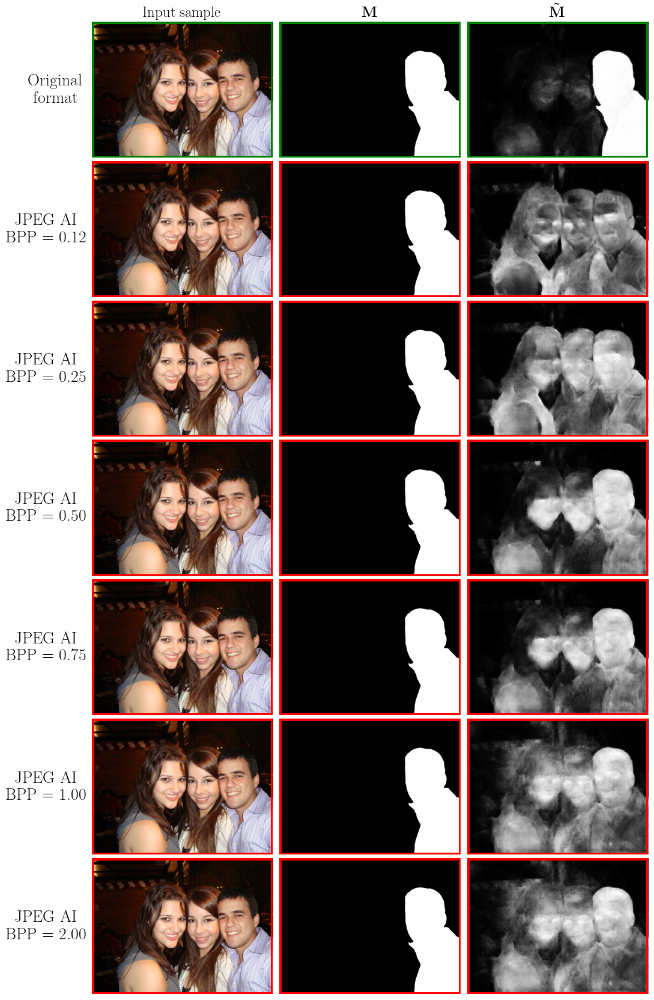

In [22]:
import matplotlib.patches as patches

unc_df = pd.read_csv(os.path.join(results_dir, 'Uncompressed', 'results.csv'), index_col=[0, 1])
jpegai_df = pd.read_csv(os.path.join(results_dir, 'JPEGAI', 'results.csv'), index_col=[0, 1])
filename = 'splicing-71'
samples = jpegai_df.loc[jpegai_df['filename']==filename]
fig, axs = plt.subplots(len(samples['target_bpp'].unique())+1, 3, figsize=(12, 3*(len(samples['target_bpp'].unique())+1)))

# Plot everything
for idx, bpp in enumerate(sorted(samples['target_bpp'].unique())):
    # Load sample
    row = samples.loc[samples['target_bpp']==bpp]
    img = Image.open(row.index.values[0][1])
    gt = Image.open(row['gt'].item()).convert('L')
    gt = np.array(gt) < 0.1  # convert as DSO-1 masks are swapped
    mask = np.load(os.path.join(results_root, row['mask_path'].item()))
    axs[idx+1][0].imshow(img), axs[idx+1][1].imshow(gt, cmap='gray'), axs[idx+1][2].imshow(mask, cmap='gray')
    axs[idx+1][0].axis('off'), axs[idx+1][1].axis('off'), axs[idx+1][2].axis('off')
    
    # Add red contour
    for ax in axs[idx+1]:
        rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    
    # Add text
    axs[idx+1][0].text(-0.25, 0.5, f'JPEG AI\n BPP = {bpp:.2f}', transform=axs[idx+1][0].transAxes, fontsize=20, va='center', ha='center')

# Load original sample and mask
row = unc_df.loc[unc_df['filename']==filename]
img = Image.open(row.index.values[0][1])
mask = np.load(os.path.join(results_root, row['mask_path'].item()))
axs[0][0].imshow(img), axs[0][1].imshow(gt, cmap='gray'), axs[0][2].imshow(mask, cmap='gray')
axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{M}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}$')
axs[0][0].axis('off'), axs[0][1].axis('off'), axs[0][2].axis('off')

# Add green contour to the first row
for ax in axs[0]:
    rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='g', facecolor='none')
    ax.add_patch(rect)

# Add text to the first row
axs[0][0].text(-0.2, 0.5, 'Original\n format', transform=axs[0][0].transAxes, fontsize=20, va='center', ha='center')

# Adjust the space between rows 
#fig.tight_layout()
fig.subplots_adjust(hspace=0.025, wspace=0.025)
plt.show()


### What about doube JPEG AI compression?
We tested just the DSO-1 for reference.

In [23]:
# Select and separe the different conditions
dso1 = results_df.loc[pd.IndexSlice[:, 'DSO-1', :, :]]
unc = dso1.loc['Uncompressed']
jpegai = dso1.loc['JPEGAI']
djpegai = dso1.loc['Double JPEGAI']
# Add source BPP info on djpegai
djpegai['Source BPP'] = [float(path.split('source_bpp-')[1].split('.')[0])/100 if 'source_bpp' in path else 'None' for path in djpegai.index.get_level_values('Path')]
djpegai.set_index('Source BPP', append=True, inplace=True)
# Compute the mean for each
unc = unc.groupby(['Quality']).mean()
jpegai = jpegai.groupby(['Quality']).mean()
djpegai = djpegai.groupby(['Quality', 'Source BPP']).mean()

# Prepare a separate DataFrame for each quality BPP
for quality in [0.12, 2.00]:
    q_djpegai = djpegai.loc[quality].transpose()
    q_djpegai.columns.name = ''
    q_djpegai.rename(columns=lambda x: f'MC {x}-{quality}', inplace=True)
    q_djpegai = q_djpegai.join(unc.transpose())
    q_jpegai = jpegai.loc[quality].transpose()
    q_jpegai.name = f'SC {quality}'
    q_djpegai = q_djpegai.join(q_jpegai)
    q_djpegai = q_djpegai[['Uncompressed', f'SC {quality}', f'MC 0.12-{quality}', f'MC 0.25-{quality}', f'MC 0.5-{quality}', f'MC 0.75-{quality}', f'MC 1.0-{quality}', f'MC 2.0-{quality}']]
    display_df = q_djpegai.style.set_caption(f"Results for double JPEG AI compression BPP = {quality}. SC = Single compression, MC = Mixed compression")
    display_df = display_df.format(lambda x: f"{x:.4f}")
    display_df = display_df.format_index(lambda x: str(x), axis=1)
    display(display_df)

,Uncompressed,SC 0.12,MC 0.12-0.12,MC 0.25-0.12,MC 0.5-0.12,MC 0.75-0.12,MC 1.0-0.12,MC 2.0-0.12
AUC,0.9937,0.7472,0.7428,0.7729,0.7761,0.7815,0.7838,0.7815
BA@0.5,0.9510,0.5773,0.5850,0.6061,0.6066,0.6065,0.6093,0.6073
BA best,0.9814,0.7322,0.7298,0.7527,0.7559,0.7584,0.7619,0.7598
F1@0.5,0.8898,0.2895,0.2935,0.3158,0.3267,0.3285,0.3321,0.3300
F1 best,0.9399,0.3979,0.3944,0.4402,0.4508,0.4533,0.4631,0.4562
FPR@0.5,0.0149,0.0822,0.0884,0.1031,0.1005,0.0980,0.0984,0.1004


,Uncompressed,SC 2.0,MC 0.12-2.0,MC 0.25-2.0,MC 0.5-2.0,MC 0.75-2.0,MC 1.0-2.0,MC 2.0-2.0
AUC,0.9937,0.9112,0.9822,0.9792,0.9587,0.9544,0.8930,0.8965
BA@0.5,0.9510,0.7935,0.9350,0.9254,0.8903,0.8822,0.7895,0.7848
BA best,0.9814,0.8850,0.9648,0.9617,0.9415,0.9347,0.8678,0.8717
F1@0.5,0.8898,0.6122,0.8429,0.8341,0.7599,0.7463,0.5900,0.5868
F1 best,0.9399,0.7285,0.9078,0.8949,0.8495,0.8342,0.6982,0.7024
FPR@0.5,0.0149,0.0795,0.0401,0.0381,0.0575,0.0632,0.1055,0.1030


### Great!
It seems there is some performance difference, but it is very limited.  
All values are really close to the ones we obtain when we perform a single compression.

## Let's see some examples

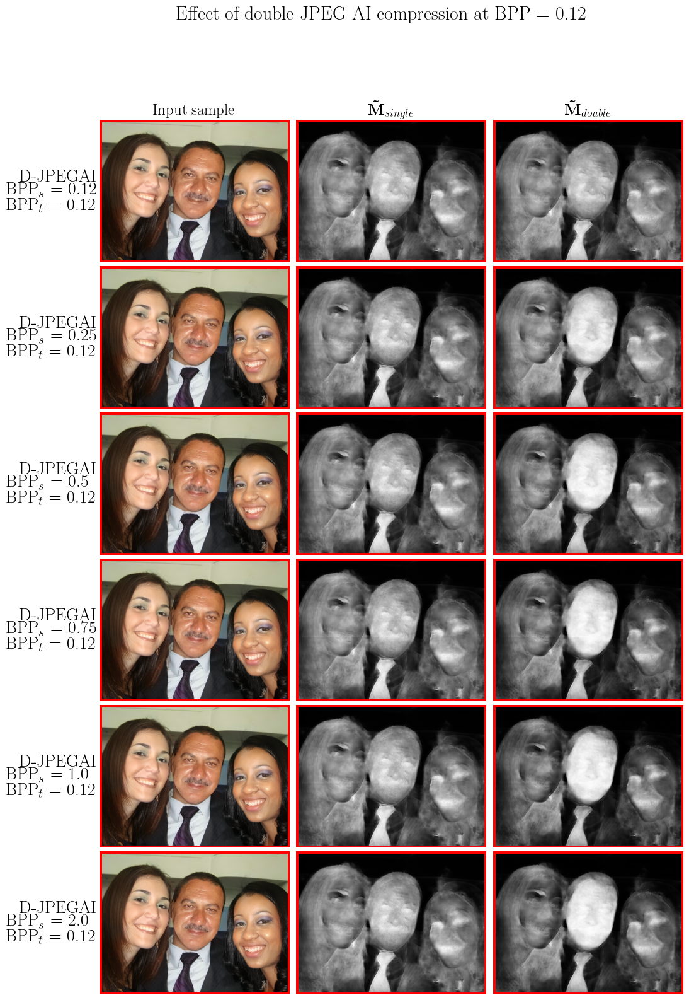

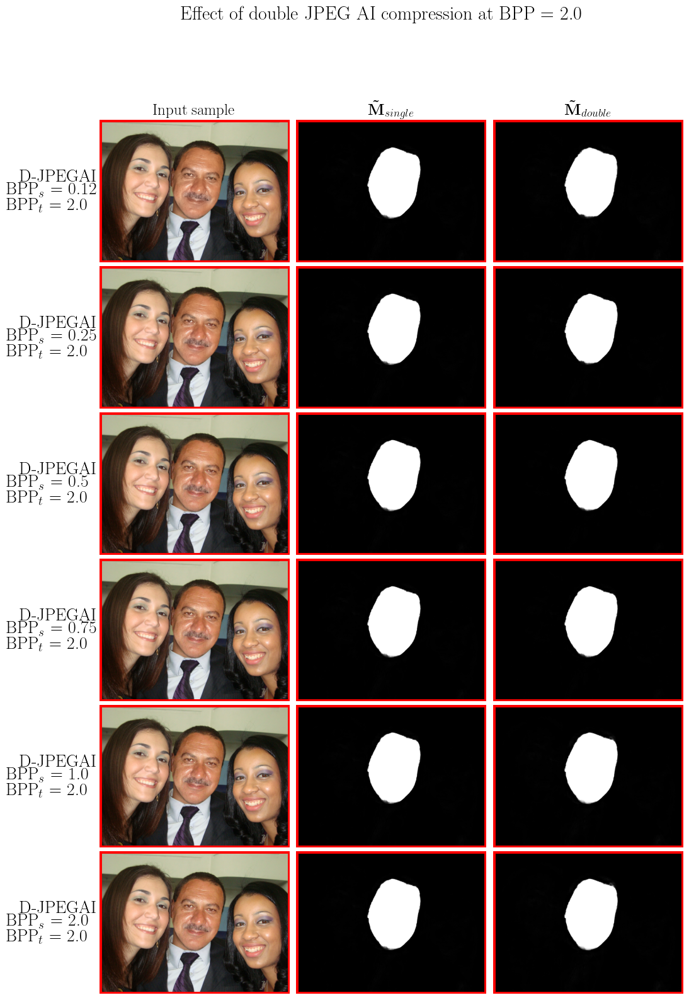

In [24]:
import matplotlib.patches as patches

# Get all the data
unc_df = pd.read_csv(os.path.join(results_dir, 'Uncompressed', 'results.csv'), index_col=[0, 1])
jpegai_df = pd.read_csv(os.path.join(results_dir, 'JPEGAI', 'results.csv'), index_col=[0, 1])
djpegai_df = pd.read_csv(os.path.join(results_dir, 'Double JPEGAI', 'results.csv'), index_col=[0, 1])
# Let's add some other columns
djpegai_df['source_bpp'] = djpegai_df['filename'].apply(lambda x: str(float(x.split('_source_bpp-')[1])/100))
djpegai_df['filename'] = djpegai_df['filename'].apply(lambda x: x.split('_source_bpp-')[0])
filename = 'splicing-99'
# Select the sample
samples = djpegai_df.loc[djpegai_df['filename']==filename]

# Cycle over target qualities
for quality in samples['target_bpp'].unique():
    
    # Select the samples
    quality_samples = samples.loc[samples['target_bpp']==quality]
    jpegai_sample = jpegai_df.loc[jpegai_df['filename']==filename]
    jpegai_sample = jpegai_sample.loc[jpegai_sample['target_bpp']==quality]
    
    # Create the figure
    fig, axs = plt.subplots(len(quality_samples['source_bpp'].unique()), 3, figsize=(12, 3*(len(quality_samples['source_bpp'].unique()))))

    # Plot everything
    for idx, bpp in enumerate(['0.12', '0.25', '0.5', '0.75', '1.0', '2.0']):
        # Load sample
        row = quality_samples.loc[quality_samples['source_bpp']==bpp]
        img = Image.open(row.index.values[0][1])
        mask_single = np.load(os.path.join(results_root, jpegai_sample['mask_path'].item()))
        mask = np.load(os.path.join(results_root, row['mask_path'].item()))
        axs[idx][0].imshow(img), axs[idx][1].imshow(mask_single, cmap='gray'), axs[idx][2].imshow(mask, cmap='gray')
        axs[idx][0].axis('off'), axs[idx][1].axis('off'), axs[idx][2].axis('off')

        # Add red contour
        for ax in axs[idx]:
            rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        # Add text
        axs[idx][0].text(-0.25, 0.5, r'D-JPEGAI\\  BPP$_{s}$ = {bpp}\\ BPP$_{t}$ = {quality}'.format(s='{s}', t='{t}',
                                                                                                     bpp=bpp, quality=quality), 
                         transform=axs[idx][0].transAxes, fontsize=20, va='center', ha='center')
        
    # Add columns names
    axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{\tilde{M}}_{single}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}_{double}$')

    # Load original sample and mask
#     row = unc_df.loc[unc_df['filename']==filename]
#     img = Image.open(row.index.values[0][1])
#     mask = np.load(os.path.join(results_root, row['mask_path'].item()))
#     axs[0][0].imshow(img), axs[0][1].imshow(gt, cmap='gray'), axs[0][2].imshow(mask, cmap='gray')
#     axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{M}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}$')
#     axs[0][0].axis('off'), axs[0][1].axis('off'), axs[0][2].axis('off')

#     # Add green contour to the first row
#     for ax in axs[0]:
#         rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='g', facecolor='none')
#         ax.add_patch(rect)

#     # Add text to the first row
#     axs[0][0].text(-0.2, 0.5, 'Original\n format', transform=axs[0][0].transAxes, fontsize=20, va='center', ha='center')

    # Adjust the space between rows 
    #fig.tight_layout()
    fig.suptitle(f'Effect of double JPEG AI compression at BPP = {quality}')
    fig.subplots_adjust(hspace=0.025, wspace=0.025)
    plt.show()


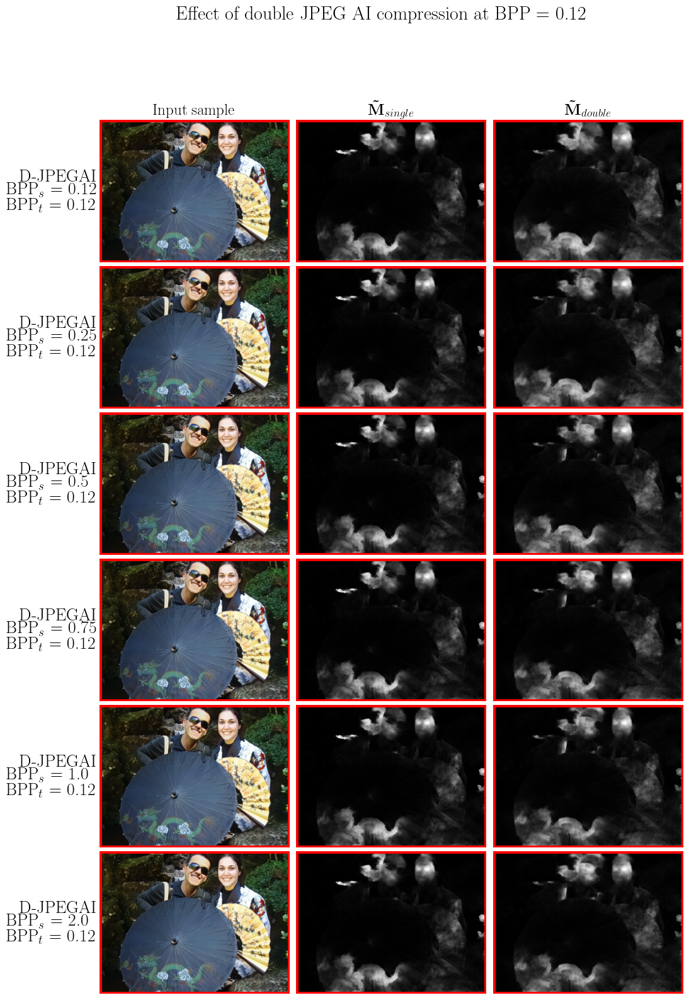

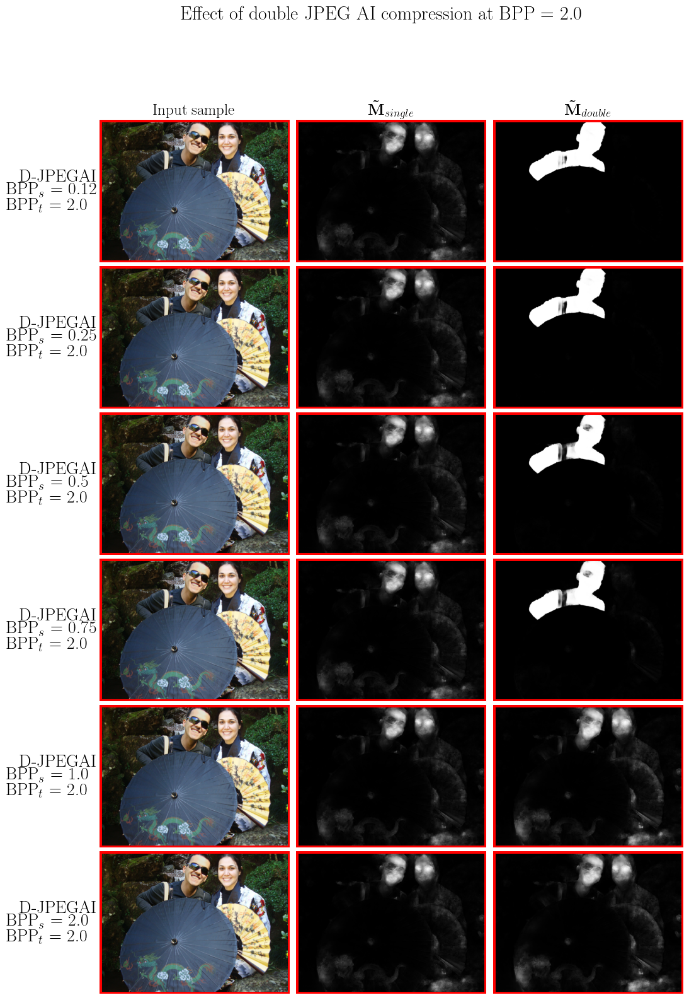

In [25]:
import matplotlib.patches as patches

# Get all the data
unc_df = pd.read_csv(os.path.join(results_dir, 'Uncompressed', 'results.csv'), index_col=[0, 1])
jpegai_df = pd.read_csv(os.path.join(results_dir, 'JPEGAI', 'results.csv'), index_col=[0, 1])
djpegai_df = pd.read_csv(os.path.join(results_dir, 'Double JPEGAI', 'results.csv'), index_col=[0, 1])
# Let's add some other columns
djpegai_df['source_bpp'] = djpegai_df['filename'].apply(lambda x: str(float(x.split('_source_bpp-')[1])/100))
djpegai_df['filename'] = djpegai_df['filename'].apply(lambda x: x.split('_source_bpp-')[0])
filename = 'splicing-34'
# Select the sample
samples = djpegai_df.loc[djpegai_df['filename']==filename]

# Cycle over target qualities
for quality in samples['target_bpp'].unique():
    
    # Select the samples
    quality_samples = samples.loc[samples['target_bpp']==quality]
    jpegai_sample = jpegai_df.loc[jpegai_df['filename']==filename]
    jpegai_sample = jpegai_sample.loc[jpegai_sample['target_bpp']==quality]
    
    # Create the figure
    fig, axs = plt.subplots(len(quality_samples['source_bpp'].unique()), 3, figsize=(12, 3*(len(quality_samples['source_bpp'].unique()))))

    # Plot everything
    for idx, bpp in enumerate(['0.12', '0.25', '0.5', '0.75', '1.0', '2.0']):
        # Load sample
        row = quality_samples.loc[quality_samples['source_bpp']==bpp]
        img = Image.open(row.index.values[0][1])
        mask_single = np.load(os.path.join(results_root, jpegai_sample['mask_path'].item()))
        mask = np.load(os.path.join(results_root, row['mask_path'].item()))
        axs[idx][0].imshow(img), axs[idx][1].imshow(mask_single, cmap='gray'), axs[idx][2].imshow(mask, cmap='gray')
        axs[idx][0].axis('off'), axs[idx][1].axis('off'), axs[idx][2].axis('off')

        # Add red contour
        for ax in axs[idx]:
            rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        # Add text
        axs[idx][0].text(-0.25, 0.5, r'D-JPEGAI\\  BPP$_{s}$ = {bpp}\\ BPP$_{t}$ = {quality}'.format(s='{s}', t='{t}',
                                                                                                     bpp=bpp, quality=quality), 
                         transform=axs[idx][0].transAxes, fontsize=20, va='center', ha='center')
        
    # Add columns names
    axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{\tilde{M}}_{single}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}_{double}$')

    # Load original sample and mask
#     row = unc_df.loc[unc_df['filename']==filename]
#     img = Image.open(row.index.values[0][1])
#     mask = np.load(os.path.join(results_root, row['mask_path'].item()))
#     axs[0][0].imshow(img), axs[0][1].imshow(gt, cmap='gray'), axs[0][2].imshow(mask, cmap='gray')
#     axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{M}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}$')
#     axs[0][0].axis('off'), axs[0][1].axis('off'), axs[0][2].axis('off')

#     # Add green contour to the first row
#     for ax in axs[0]:
#         rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='g', facecolor='none')
#         ax.add_patch(rect)

#     # Add text to the first row
#     axs[0][0].text(-0.2, 0.5, 'Original\n format', transform=axs[0][0].transAxes, fontsize=20, va='center', ha='center')

    # Adjust the space between rows 
    #fig.tight_layout()
    fig.suptitle(f'Effect of double JPEG AI compression at BPP = {quality}')
    fig.subplots_adjust(hspace=0.025, wspace=0.025)
    plt.show()


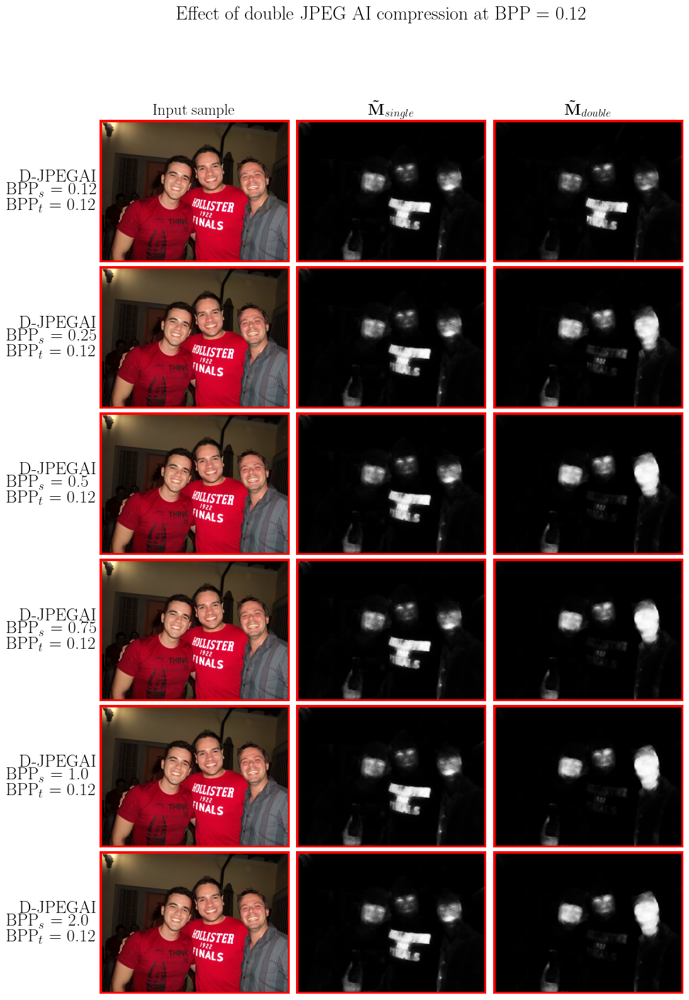

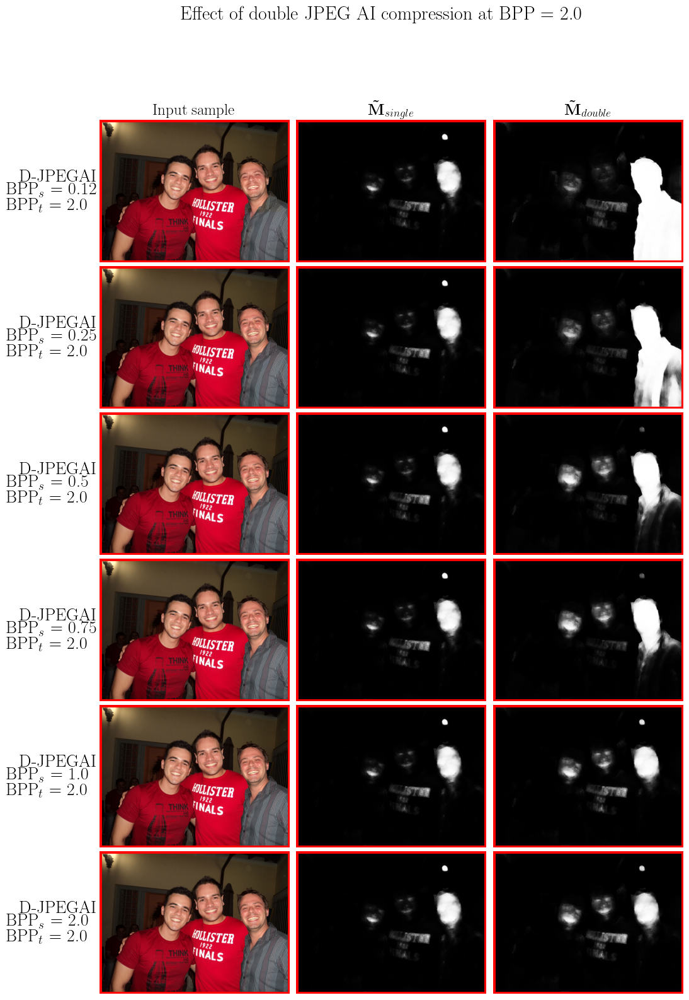

In [26]:
import matplotlib.patches as patches

# Get all the data
unc_df = pd.read_csv(os.path.join(results_dir, 'Uncompressed', 'results.csv'), index_col=[0, 1])
jpegai_df = pd.read_csv(os.path.join(results_dir, 'JPEGAI', 'results.csv'), index_col=[0, 1])
djpegai_df = pd.read_csv(os.path.join(results_dir, 'Double JPEGAI', 'results.csv'), index_col=[0, 1])
# Let's add some other columns
djpegai_df['source_bpp'] = djpegai_df['filename'].apply(lambda x: str(float(x.split('_source_bpp-')[1])/100))
djpegai_df['filename'] = djpegai_df['filename'].apply(lambda x: x.split('_source_bpp-')[0])
filename = 'splicing-12'
# Select the sample
samples = djpegai_df.loc[djpegai_df['filename']==filename]

# Cycle over target qualities
for quality in samples['target_bpp'].unique():
    
    # Select the samples
    quality_samples = samples.loc[samples['target_bpp']==quality]
    jpegai_sample = jpegai_df.loc[jpegai_df['filename']==filename]
    jpegai_sample = jpegai_sample.loc[jpegai_sample['target_bpp']==quality]
    
    # Create the figure
    fig, axs = plt.subplots(len(quality_samples['source_bpp'].unique()), 3, figsize=(12, 3*(len(quality_samples['source_bpp'].unique()))))

    # Plot everything
    for idx, bpp in enumerate(['0.12', '0.25', '0.5', '0.75', '1.0', '2.0']):
        # Load sample
        row = quality_samples.loc[quality_samples['source_bpp']==bpp]
        img = Image.open(row.index.values[0][1])
        mask_single = np.load(os.path.join(results_root, jpegai_sample['mask_path'].item()))
        mask = np.load(os.path.join(results_root, row['mask_path'].item()))
        axs[idx][0].imshow(img), axs[idx][1].imshow(mask_single, cmap='gray'), axs[idx][2].imshow(mask, cmap='gray')
        axs[idx][0].axis('off'), axs[idx][1].axis('off'), axs[idx][2].axis('off')

        # Add red contour
        for ax in axs[idx]:
            rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        # Add text
        axs[idx][0].text(-0.25, 0.5, r'D-JPEGAI\\  BPP$_{s}$ = {bpp}\\ BPP$_{t}$ = {quality}'.format(s='{s}', t='{t}',
                                                                                                     bpp=bpp, quality=quality), 
                         transform=axs[idx][0].transAxes, fontsize=20, va='center', ha='center')
        
    # Add columns names
    axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{\tilde{M}}_{single}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}_{double}$')

    # Load original sample and mask
#     row = unc_df.loc[unc_df['filename']==filename]
#     img = Image.open(row.index.values[0][1])
#     mask = np.load(os.path.join(results_root, row['mask_path'].item()))
#     axs[0][0].imshow(img), axs[0][1].imshow(gt, cmap='gray'), axs[0][2].imshow(mask, cmap='gray')
#     axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{M}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}$')
#     axs[0][0].axis('off'), axs[0][1].axis('off'), axs[0][2].axis('off')

#     # Add green contour to the first row
#     for ax in axs[0]:
#         rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='g', facecolor='none')
#         ax.add_patch(rect)

#     # Add text to the first row
#     axs[0][0].text(-0.2, 0.5, 'Original\n format', transform=axs[0][0].transAxes, fontsize=20, va='center', ha='center')

    # Adjust the space between rows 
    #fig.tight_layout()
    fig.suptitle(f'Effect of double JPEG AI compression at BPP = {quality}')
    fig.subplots_adjust(hspace=0.025, wspace=0.025)
    plt.show()


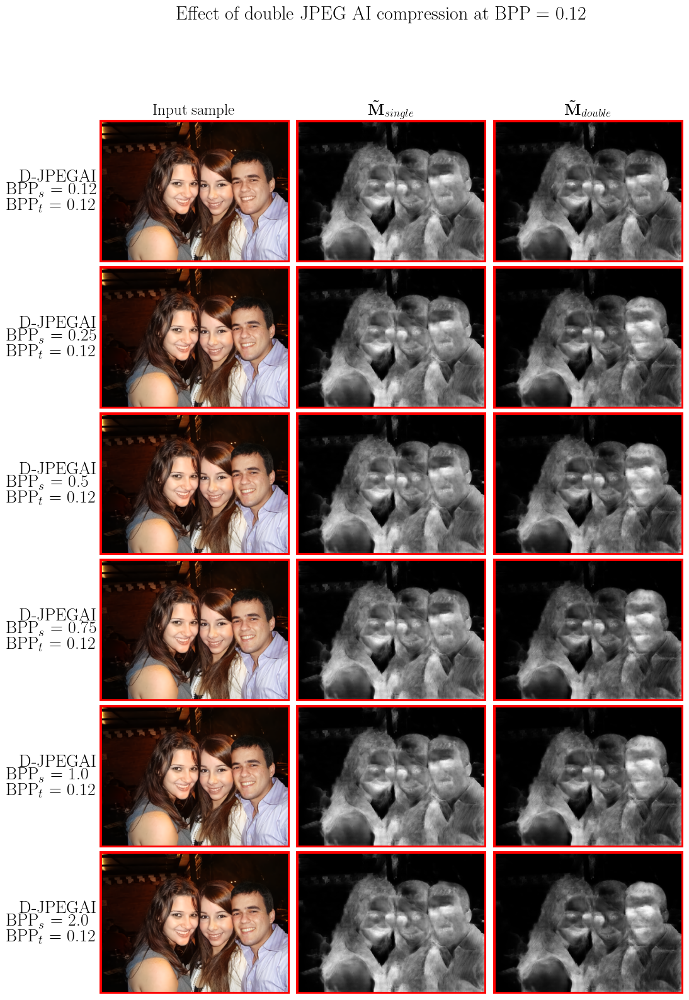

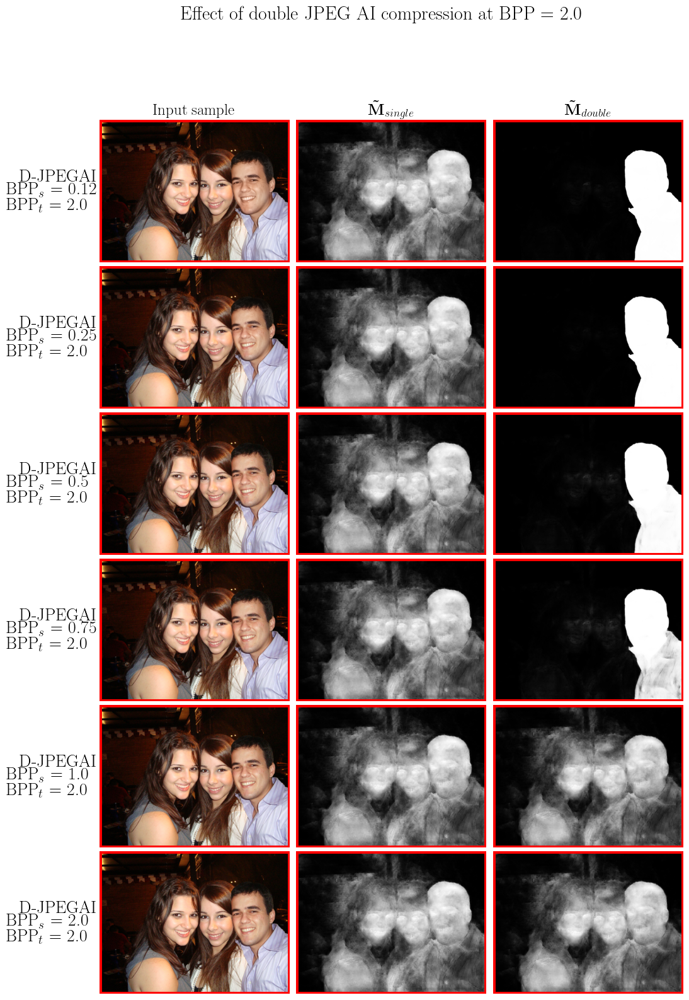

In [27]:
import matplotlib.patches as patches

# Get all the data
unc_df = pd.read_csv(os.path.join(results_dir, 'Uncompressed', 'results.csv'), index_col=[0, 1])
jpegai_df = pd.read_csv(os.path.join(results_dir, 'JPEGAI', 'results.csv'), index_col=[0, 1])
djpegai_df = pd.read_csv(os.path.join(results_dir, 'Double JPEGAI', 'results.csv'), index_col=[0, 1])
# Let's add some other columns
djpegai_df['source_bpp'] = djpegai_df['filename'].apply(lambda x: str(float(x.split('_source_bpp-')[1])/100))
djpegai_df['filename'] = djpegai_df['filename'].apply(lambda x: x.split('_source_bpp-')[0])
filename = 'splicing-71'
# Select the sample
samples = djpegai_df.loc[djpegai_df['filename']==filename]

# Cycle over target qualities
for quality in samples['target_bpp'].unique():
    
    # Select the samples
    quality_samples = samples.loc[samples['target_bpp']==quality]
    jpegai_sample = jpegai_df.loc[jpegai_df['filename']==filename]
    jpegai_sample = jpegai_sample.loc[jpegai_sample['target_bpp']==quality]
    
    # Create the figure
    fig, axs = plt.subplots(len(quality_samples['source_bpp'].unique()), 3, figsize=(12, 3*(len(quality_samples['source_bpp'].unique()))))

    # Plot everything
    for idx, bpp in enumerate(['0.12', '0.25', '0.5', '0.75', '1.0', '2.0']):
        # Load sample
        row = quality_samples.loc[quality_samples['source_bpp']==bpp]
        img = Image.open(row.index.values[0][1])
        mask_single = np.load(os.path.join(results_root, jpegai_sample['mask_path'].item()))
        mask = np.load(os.path.join(results_root, row['mask_path'].item()))
        axs[idx][0].imshow(img), axs[idx][1].imshow(mask_single, cmap='gray'), axs[idx][2].imshow(mask, cmap='gray')
        axs[idx][0].axis('off'), axs[idx][1].axis('off'), axs[idx][2].axis('off')

        # Add red contour
        for ax in axs[idx]:
            rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

        # Add text
        axs[idx][0].text(-0.25, 0.5, r'D-JPEGAI\\  BPP$_{s}$ = {bpp}\\ BPP$_{t}$ = {quality}'.format(s='{s}', t='{t}',
                                                                                                     bpp=bpp, quality=quality), 
                         transform=axs[idx][0].transAxes, fontsize=20, va='center', ha='center')
        
    # Add columns names
    axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{\tilde{M}}_{single}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}_{double}$')

    # Load original sample and mask
#     row = unc_df.loc[unc_df['filename']==filename]
#     img = Image.open(row.index.values[0][1])
#     mask = np.load(os.path.join(results_root, row['mask_path'].item()))
#     axs[0][0].imshow(img), axs[0][1].imshow(gt, cmap='gray'), axs[0][2].imshow(mask, cmap='gray')
#     axs[0][0].set_title('Input sample'), axs[0][1].set_title(r'$\mathbf{M}$'), axs[0][2].set_title(r'$\mathbf{\tilde{M}}$')
#     axs[0][0].axis('off'), axs[0][1].axis('off'), axs[0][2].axis('off')

#     # Add green contour to the first row
#     for ax in axs[0]:
#         rect = patches.Rectangle((0, 0), img.size[0], img.size[1], linewidth=5, edgecolor='g', facecolor='none')
#         ax.add_patch(rect)

#     # Add text to the first row
#     axs[0][0].text(-0.2, 0.5, 'Original\n format', transform=axs[0][0].transAxes, fontsize=20, va='center', ha='center')

    # Adjust the space between rows 
    #fig.tight_layout()
    fig.suptitle(f'Effect of double JPEG AI compression at BPP = {quality}')
    fig.subplots_adjust(hspace=0.025, wspace=0.025)
    plt.show()
